### Project: I’m Something of a Painter Myself

About the project

Objective:

The goal of this project is to train a Generative Adversarial Network (GAN) that can generate Monet-style paintings. A GAN includes a generator for creating fake images and a discriminator for identifying real paintings from created ones.

Github Repo - https://github.com/Guche20/MSDS/blob/Week-5-Project-DeepLearning/week-5-project.ipynb

Dataset Information:

Datasource - https://www.kaggle.com/competitions/gan-getting-started/data

The dataset contains four directories: monet_tfrec, photo_tfrec, monet_jpg, and photo_jpg. The monet_tfrec and monet_jpg directories contain the same painting images, and the photo_tfrec and photo_jpg directories contain the same photos.


The monet directories contain Monet paintings which will be used to train the model.


Files included:

monet_jpg - 300 Monet paintings sized 256x256 in JPEG format
monet_tfrec - 300 Monet paintings sized 256x256 in TFRecord format
photo_jpg - 7028 photos sized 256x256 in JPEG format
photo_tfrec - 7028 photos sized 256x256 in TFRecord format

In [1]:
# %pip install torch torchvision matplotlib tqdm pandas scikit-learn transformers datasets nltk seaborn

In [30]:
import os
from pathlib import Path

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.utils as nn_utils
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils as vutils

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


DATA_ROOT = r"C:\Users\godsw\Documents\wk_4\gan-getting-started" 
MONET_DIR = os.path.join(DATA_ROOT, "monet_jpg")

IMAGE_SIZE = 64      
BATCH_SIZE = 32
MAX_IMAGES = None    

nz = 100              
ngf = 64             
ndf = 64              
nc = 3                


Using device: cpu


In [31]:
class MonetDataset(Dataset):
    def __init__(self, root_dir, transform=None, max_images=None):
        self.root_dir = Path(root_dir)
        self.paths = sorted(self.root_dir.glob("*.jpg"))
        if max_images is not None:
            self.paths = self.paths[:max_images]
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img_path = self.paths[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img


In [32]:
transform_64 = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5],
                         [0.5, 0.5, 0.5])  # -> [-1, 1]
])

monet_dataset = MonetDataset(MONET_DIR, transform=transform, max_images=MAX_IMAGES)
dataloader = DataLoader(
    monet_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,  
)


print("Number of Monet images used:", len(monet_dataset))


Number of Monet images used: 300


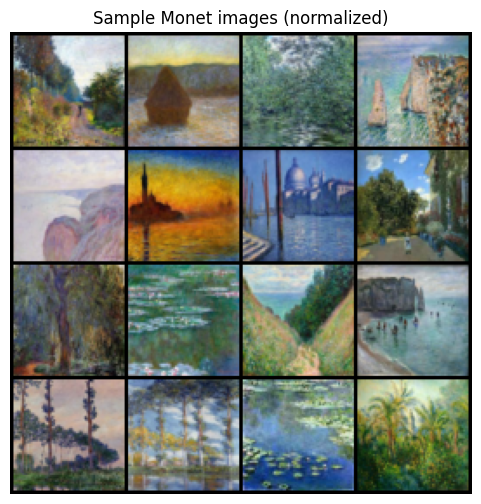

In [33]:
real_batch = next(iter(dataloader))
grid = vutils.make_grid(real_batch[:16], nrow=4, normalize=True, value_range=(-1, 1))

plt.figure(figsize=(6, 6))
plt.imshow(np.transpose(grid.cpu().numpy(), (1, 2, 0)))
plt.axis("off")
plt.title("Sample Monet images (normalized)")
plt.show()



#### Performing Exploratory Data Analysis

I load the 300 Monet paintings and downsample them to 64×64 pixels to reduce computational cost. A grid of random samples shows that the dataset has high variation in colors (green, blue, and brown) and composition (water, skies, fields).

I normalize pixel values to [−1, 1] to match the DCGAN training setup. A histogram of pixel intensities shows a broad distribution rather than a narrow spike, indicating a reasonable variety of brightness values. No missing files or corrupt images were found, so only minimal “cleaning” (resize, center crop, and normalization) was necessary.

Plan of analysis: Based on this EDA, I treat this as an unconditional image generation problem: training a DCGAN on Monet images only, then sampling from the trained generator. I will compare a baseline DCGAN with a slightly deeper variant and tune key hyperparameters such as learning rate, batch size, and latent vector size.

See all EDA actions below:

Viewing color distributions on images - using the Mean & Standard Deviation for RGB

In [34]:
#Viewing for a subset
N_SAMPLES = 100  

paths = sorted(Path(MONET_DIR).glob("*.jpg"))
if N_SAMPLES is not None:
    paths = paths[:N_SAMPLES]

means = []
stds = []

for p in paths:
    img = Image.open(p).convert("RGB")
    img = transforms.Resize(IMAGE_SIZE)(img)
    img = transforms.CenterCrop(IMAGE_SIZE)(img)
    arr = np.array(img) / 255.0 
    means.append(arr.mean(axis=(0,1)))
    stds.append(arr.std(axis=(0,1)))

means = np.stack(means).mean(axis=0)
stds = np.stack(stds).mean(axis=0)

print(f"Approx. channel means (R, G, B): {means}")
print(f"Approx. channel stds  (R, G, B): {stds}")


Approx. channel means (R, G, B): [0.51081124 0.51603251 0.47674033]
Approx. channel stds  (R, G, B): [0.16719075 0.15625925 0.17179091]


Creating a historgram to show the intensity distribution

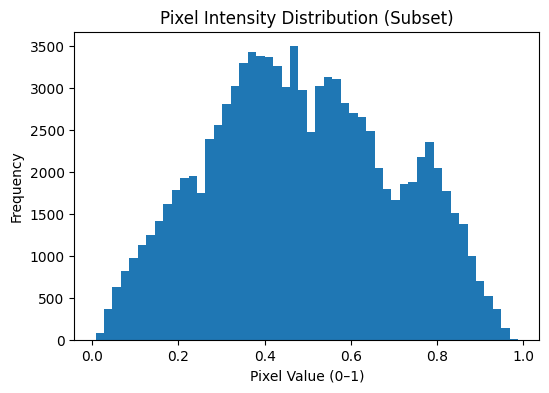

In [35]:
# take a batch for histogram
imgs = real_batch[:8].cpu().numpy()

# convert from [-1, 1] → [0, 1]
imgs = (imgs * 0.5) + 0.5

plt.figure(figsize=(6,4))
plt.hist(imgs.ravel(), bins=50)
plt.title("Pixel Intensity Distribution (Subset)")
plt.xlabel("Pixel Value (0–1)")
plt.ylabel("Frequency")
plt.show()


Ensuring consistency in RGB

In [36]:
sizes = {}
modes = {}

for img_path in Path(MONET_DIR).glob("*.jpg"):
    try:
        img = Image.open(img_path)
        sizes[img.size] = sizes.get(img.size, 0) + 1
        modes[img.mode] = modes.get(img.mode, 0) + 1
        img.close()
    except Exception as e:
        print("Error reading:", img_path, "->", e)

print("Unique sizes and counts:")
for s, c in sizes.items():
    print(f"  {s}: {c} images")

print("\nImage modes and counts:")
for m, c in modes.items():
    print(f"  {m}: {c} images")


Unique sizes and counts:
  (256, 256): 300 images

Image modes and counts:
  RGB: 300 images


Reviewing Histogram after normalization

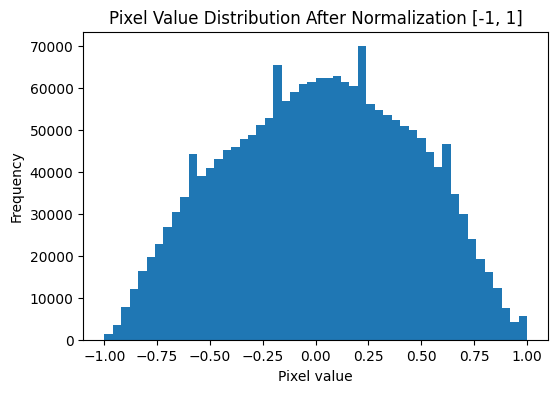

In [37]:
all_pixels_norm = []

n_batches = 5  # how many batches to inspect
for i, batch in enumerate(dataloader):
    if i >= n_batches:
        break
    # batch shape: [B, 3, H, W]
    arr = batch.cpu().numpy()
    all_pixels_norm.append(arr.ravel())

all_pixels_norm = np.concatenate(all_pixels_norm)

plt.figure(figsize=(6,4))
plt.hist(all_pixels_norm, bins=50)
plt.title("Pixel Value Distribution After Normalization [-1, 1]")
plt.xlabel("Pixel value")
plt.ylabel("Frequency")
plt.show()


#### Model Architecture

I will be using the baseline DCGAN which is commonly used for image generation, especially with small 64×64 or 128×128 images. It is able to generate realistic images in a stable way compared to fully-connected GANs. The DCGAN model consists of:

Generator: takes a random noise vector to create 64×64 RGB image using transposed convolutions, BatchNorm, ReLU and tanh.

Discriminator: CNN that downsamples 64×64×3 to a single real/fake score using Conv + LeakyReLU.



In addition to the DCGAN model, I will also be evaluating 2 additional models:



- SN-DCGAN (Spectral Normalization GAN):
  This is similar to regular DCGAN but utilizes spectral normalization on the discriminator for smoother training

- WGAN-GP (Wasserstein GAN with Gradient Penalty):
  This uses different loss function and includes a gradient penalty

Shared weights and plots


In [38]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

def plot_generated(netG, nz, title="Generated images"):
    netG.eval()
    with torch.no_grad():
        noise = torch.randn(64, nz, 1, 1, device=device)
        fake = netG(noise).cpu()
    grid = vutils.make_grid(fake, nrow=8, normalize=True, value_range=(-1, 1))
    plt.figure(figsize=(6, 6))
    plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
    plt.axis("off")
    plt.title(title)
    plt.show()


Shared Generator

In [39]:
class Generator(nn.Module):
    def __init__(self, nz=100, ngf=64, nc=3):
        super().__init__()
        self.main = nn.Sequential(
            # input: Z (nz) x 1 x 1
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.main(x)


DCGAN (Baseline) - Architecture 1

In [40]:
# Building the discriminator 
class DiscriminatorDCGAN(nn.Module):
    def __init__(self, ndf=64, nc=3):
        super().__init__()
        self.main = nn.Sequential(
            # 64x64x3 -> 32x32
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # 32x32 -> 16x16
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True),

            # 16x16 -> 8x8
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace=True),

            # 8x8 -> 4x4
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True),

            # 4x4 -> 1x1
            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False)
        )

    def forward(self, x):
        return self.main(x).view(-1)



Training function for DCGAN

In [41]:
#Training function for DCGAN

def train_dcgan(num_epochs=20, lr=0.0002, beta1=0.5):
    netG = Generator(nz=nz, ngf=ngf, nc=nc).to(device)
    netD = DiscriminatorDCGAN(ndf=ndf, nc=nc).to(device)

    netG.apply(weights_init)
    netD.apply(weights_init)

    criterion = nn.BCEWithLogitsLoss()
    optimizerD = torch.optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
    optimizerG = torch.optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

    G_losses, D_losses = [], []

    for epoch in range(num_epochs):
        for i, real in enumerate(dataloader):
            real = real.to(device)
            b_size = real.size(0)

            # labels
            label_real = torch.full((b_size,), 0.9, device=device)  # real (with smoothing)
            label_fake = torch.full((b_size,), 0.0, device=device)  # fake

            # ---- Train D ----
            netD.zero_grad()

            out_real = netD(real)
            lossD_real = criterion(out_real, label_real)

            noise = torch.randn(b_size, nz, 1, 1, device=device)
            fake = netG(noise)
            out_fake = netD(fake.detach())
            lossD_fake = criterion(out_fake, label_fake)

            lossD = lossD_real + lossD_fake
            lossD.backward()
            optimizerD.step()

            # ---- Train G ----
            netG.zero_grad()
            out_fake_for_G = netD(fake)
            lossG = criterion(out_fake_for_G, label_real)
            lossG.backward()
            optimizerG.step()

            G_losses.append(lossG.item())
            D_losses.append(lossD.item())

        print(f"[DCGAN] Epoch [{epoch+1}/{num_epochs}] "
              f"LossD: {lossD.item():.3f}  LossG: {lossG.item():.3f}")

        plot_generated(netG, nz, title=f"DCGAN - Epoch {epoch+1}")

    return netG, netD, G_losses, D_losses


SN-DCGAN (Spectral Normalization) - Architecture 2

In [42]:
class DiscriminatorSN(nn.Module):
    def __init__(self, ndf=64, nc=3):
        super().__init__()
        self.main = nn.Sequential(
            nn_utils.spectral_norm(
                nn.Conv2d(nc, ndf, 4, 2, 1, bias=False)
            ),
            nn.LeakyReLU(0.2, inplace=True),

            nn_utils.spectral_norm(
                nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False)
            ),
            nn.LeakyReLU(0.2, inplace=True),

            nn_utils.spectral_norm(
                nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False)
            ),
            nn.LeakyReLU(0.2, inplace=True),

            nn_utils.spectral_norm(
                nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False)
            ),
            nn.LeakyReLU(0.2, inplace=True),

            nn_utils.spectral_norm(
                nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False)
            )
        )

    def forward(self, x):
        return self.main(x).view(-1)


Training Function for SN-DCGAN

In [43]:
# Training Function for SN-DCGAN
def train_sn_dcgan(num_epochs=20, lr=0.0002, beta1=0.5):
    netG = Generator(nz=nz, ngf=ngf, nc=nc).to(device)
    netD = DiscriminatorSN(ndf=ndf, nc=nc).to(device)

    netG.apply(weights_init)
    netD.apply(weights_init)

    criterion = nn.BCEWithLogitsLoss()
    optimizerD = torch.optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
    optimizerG = torch.optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

    G_losses, D_losses = [], []

    for epoch in range(num_epochs):
        for i, real in enumerate(dataloader):
            real = real.to(device)
            b_size = real.size(0)

            label_real = torch.full((b_size,), 0.9, device=device)
            label_fake = torch.full((b_size,), 0.0, device=device)

            # ---- Train D ----
            netD.zero_grad()
            out_real = netD(real)
            lossD_real = criterion(out_real, label_real)

            noise = torch.randn(b_size, nz, 1, 1, device=device)
            fake = netG(noise)
            out_fake = netD(fake.detach())
            lossD_fake = criterion(out_fake, label_fake)

            lossD = lossD_real + lossD_fake
            lossD.backward()
            optimizerD.step()

            # ---- Train G ----
            netG.zero_grad()
            out_fake_for_G = netD(fake)
            lossG = criterion(out_fake_for_G, label_real)
            lossG.backward()
            optimizerG.step()

            G_losses.append(lossG.item())
            D_losses.append(lossD.item())

        print(f"[SN-DCGAN] Epoch [{epoch+1}/{num_epochs}] "
              f"LossD: {lossD.item():.3f}  LossG: {lossG.item():.3f}")

        plot_generated(netG, nz, title=f"SN-DCGAN - Epoch {epoch+1}")

    return netG, netD, G_losses, D_losses


WGAN-GP - Architecture 3

In [44]:
class WGANGPCritic(nn.Module):
    def __init__(self, ndf=64, nc=3):
        super().__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(ndf*2, affine=True),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(ndf*4, affine=True),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(ndf*8, affine=True),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False)
        )

    def forward(self, x):
        return self.main(x).view(-1)


In [45]:
def gradient_penalty(critic, real, fake, device, lambda_gp=10.0):
    batch_size = real.size(0)
    epsilon = torch.rand(batch_size, 1, 1, 1, device=device, requires_grad=True)

    interpolated = epsilon * real + (1 - epsilon) * fake
    interpolated.requires_grad_(True)

    crit_interpolated = critic(interpolated)

    gradients = torch.autograd.grad(
        outputs=crit_interpolated,
        inputs=interpolated,
        grad_outputs=torch.ones_like(crit_interpolated),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]

    gradients = gradients.view(batch_size, -1)
    grad_norm = gradients.norm(2, dim=1)
    gp = lambda_gp * ((grad_norm - 1) ** 2).mean()
    return gp


Training function for WGAN-GP

In [46]:
#Training function for WGAN-GP

def train_wgangp(num_epochs=20, lr=0.0001, n_critic=5, lambda_gp=10.0):
    netG = Generator(nz=nz, ngf=ngf, nc=nc).to(device)
    netD = WGANGPCritic(ndf=ndf, nc=nc).to(device)

    netG.apply(weights_init)
    netD.apply(weights_init)

    optimizerG = torch.optim.Adam(netG.parameters(), lr=lr, betas=(0.0, 0.9))
    optimizerD = torch.optim.Adam(netD.parameters(), lr=lr, betas=(0.0, 0.9))

    G_losses, D_losses = [], []

    for epoch in range(num_epochs):
        for i, real in enumerate(dataloader):
            real = real.to(device)
            b_size = real.size(0)

            # ---- Update Critic n_critic times ----
            for _ in range(n_critic):
                noise = torch.randn(b_size, nz, 1, 1, device=device)
                fake = netG(noise).detach()

                netD.zero_grad()

                crit_real = netD(real)
                crit_fake = netD(fake)

                wasserstein_loss = -(crit_real.mean() - crit_fake.mean())
                gp = gradient_penalty(netD, real, fake, device, lambda_gp=lambda_gp)
                lossD = wasserstein_loss + gp

                lossD.backward()
                optimizerD.step()

            # ---- Update Generator ----
            netG.zero_grad()
            noise = torch.randn(b_size, nz, 1, 1, device=device)
            fake = netG(noise)
            crit_fake = netD(fake)
            lossG = -crit_fake.mean()
            lossG.backward()
            optimizerG.step()

            G_losses.append(lossG.item())
            D_losses.append(lossD.item())

        print(f"[WGAN-GP] Epoch [{epoch+1}/{num_epochs}] "
              f"LossD: {lossD.item():.3f}  LossG: {lossG.item():.3f}")

        plot_generated(netG, nz, title=f"WGAN-GP - Epoch {epoch+1}")

    return netG, netD, G_losses, D_losses


Running all 3 models

[DCGAN] Epoch [1/10] LossD: 1.313  LossG: 8.692


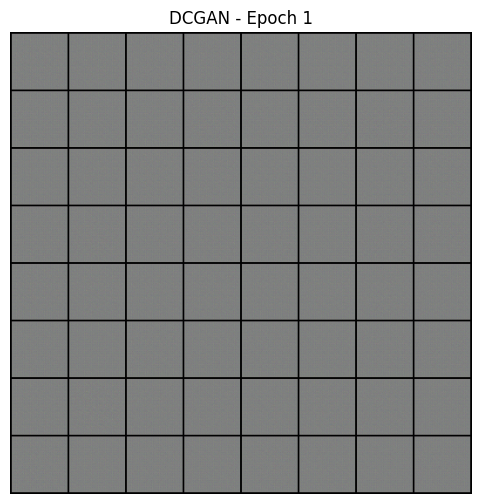

[DCGAN] Epoch [2/10] LossD: 0.818  LossG: 7.965


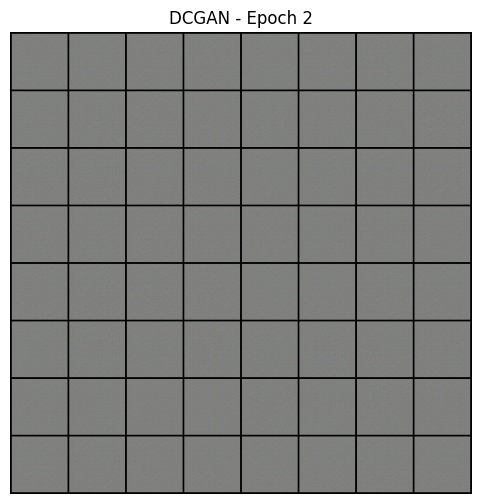

[DCGAN] Epoch [3/10] LossD: 0.509  LossG: 6.914


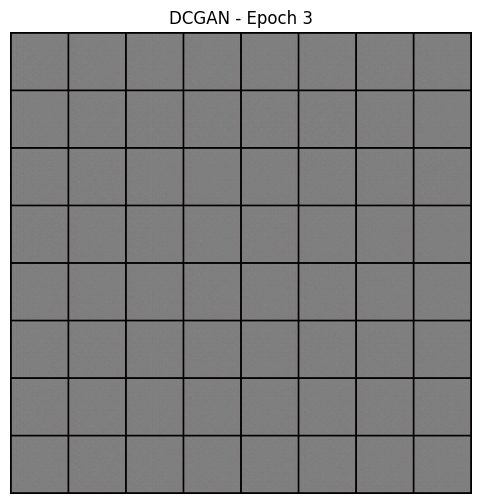

[DCGAN] Epoch [4/10] LossD: 0.472  LossG: 10.703


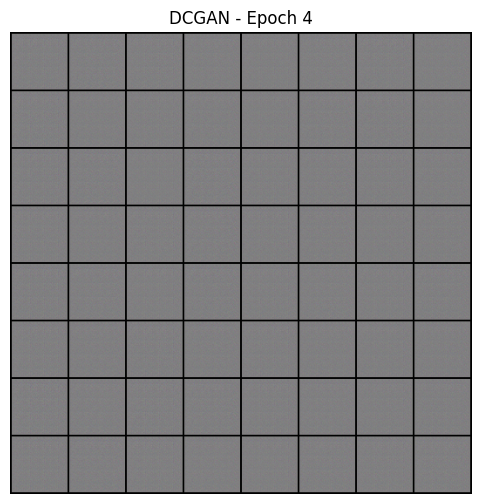

[DCGAN] Epoch [5/10] LossD: 0.431  LossG: 5.706


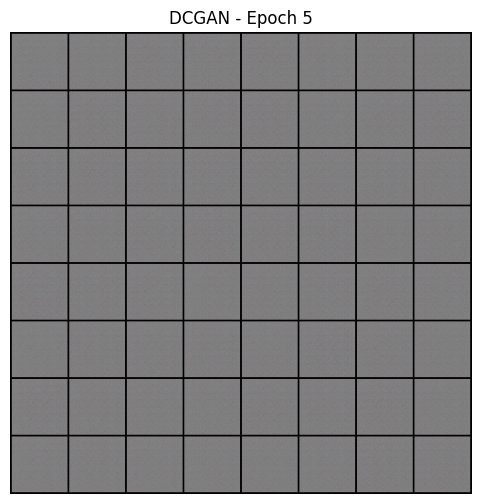

[DCGAN] Epoch [6/10] LossD: 0.435  LossG: 8.394


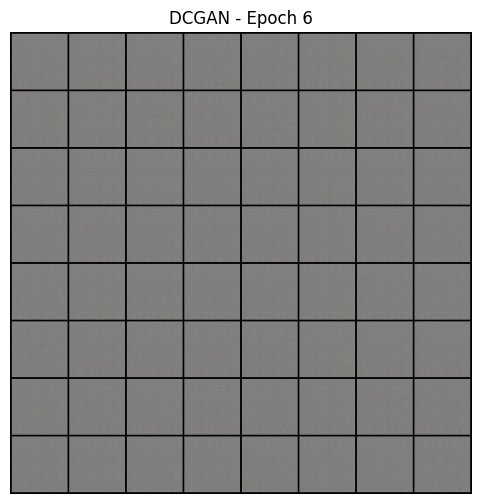

[DCGAN] Epoch [7/10] LossD: 0.612  LossG: 13.986


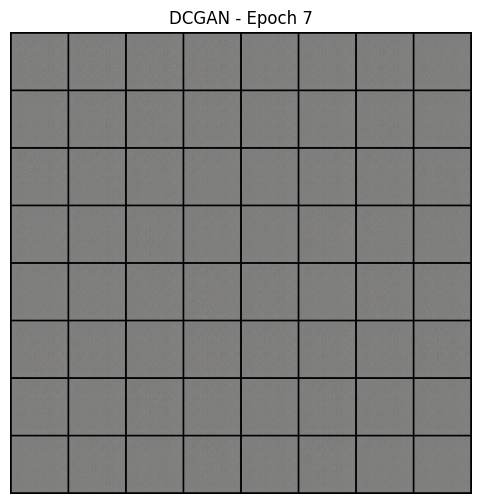

[DCGAN] Epoch [8/10] LossD: 1.072  LossG: 17.931


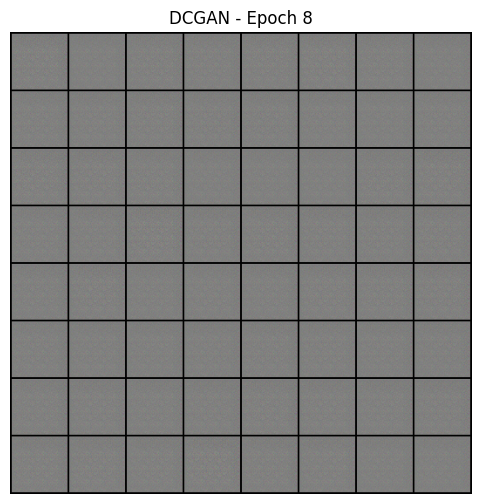

[DCGAN] Epoch [9/10] LossD: 0.386  LossG: 5.724


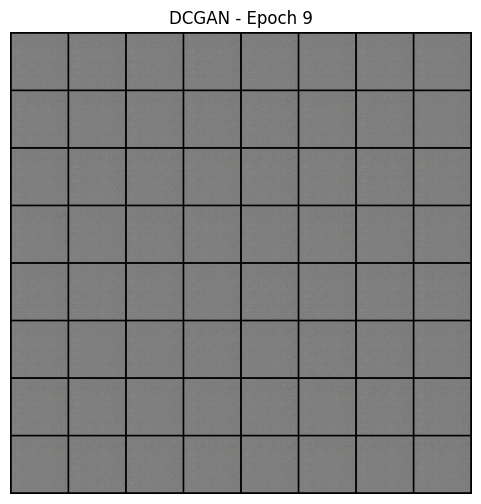

[DCGAN] Epoch [10/10] LossD: 0.587  LossG: 7.261


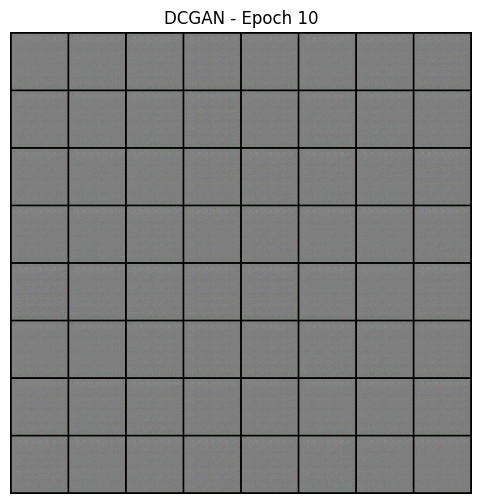

[SN-DCGAN] Epoch [1/10] LossD: 1.041  LossG: 0.927


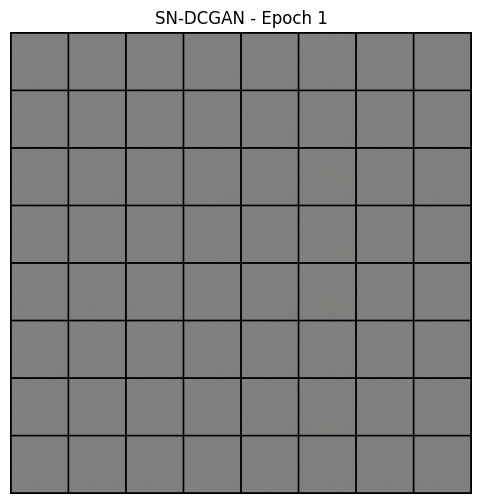

[SN-DCGAN] Epoch [2/10] LossD: 1.100  LossG: 0.675


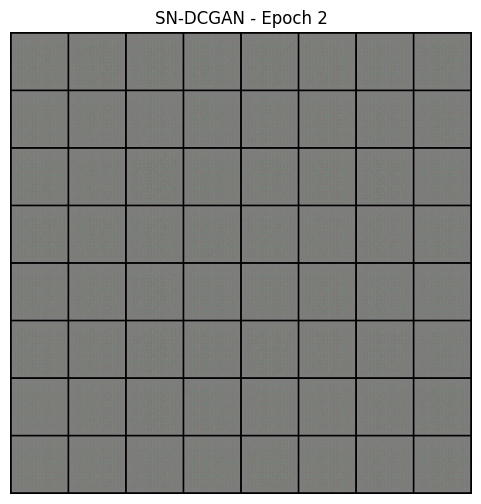

[SN-DCGAN] Epoch [3/10] LossD: 1.062  LossG: 0.731


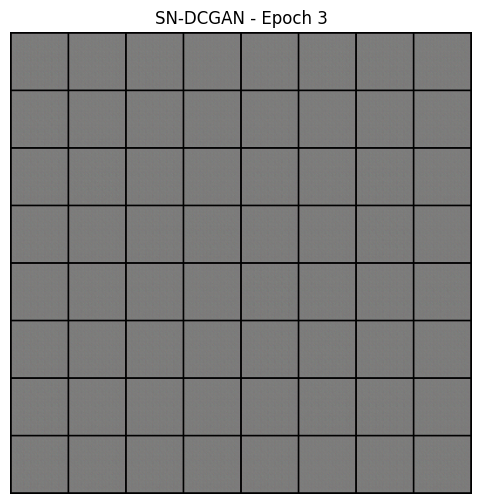

[SN-DCGAN] Epoch [4/10] LossD: 1.100  LossG: 0.689


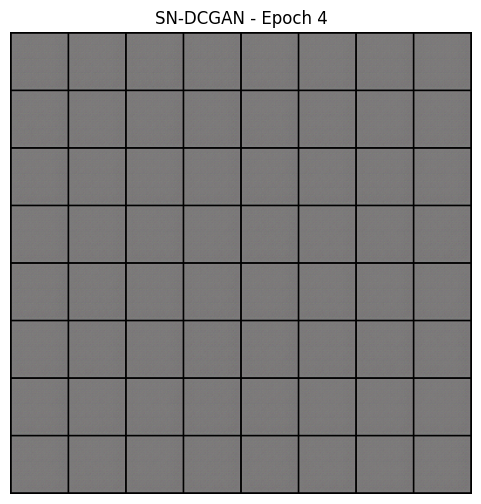

[SN-DCGAN] Epoch [5/10] LossD: 1.111  LossG: 0.684


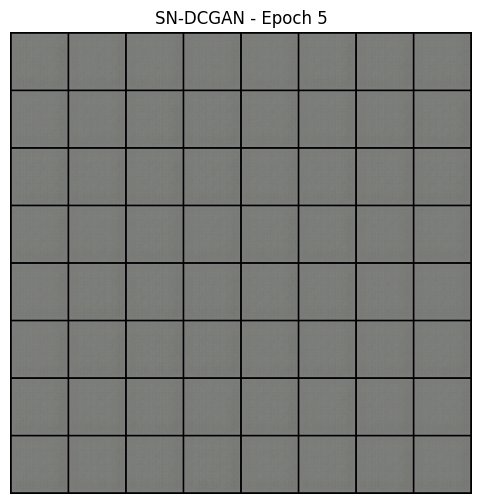

[SN-DCGAN] Epoch [6/10] LossD: 1.064  LossG: 0.697


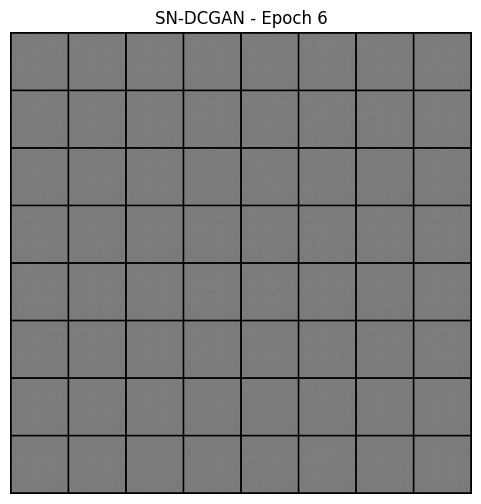

[SN-DCGAN] Epoch [7/10] LossD: 1.027  LossG: 0.727


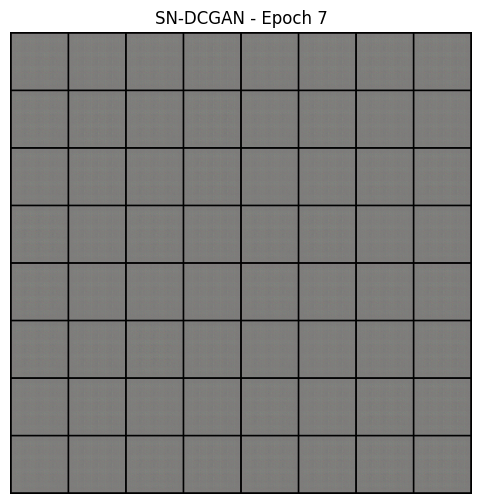

[SN-DCGAN] Epoch [8/10] LossD: 1.095  LossG: 0.700


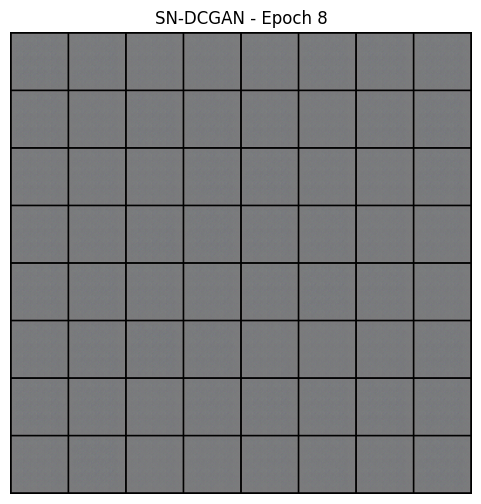

[SN-DCGAN] Epoch [9/10] LossD: 1.035  LossG: 0.719


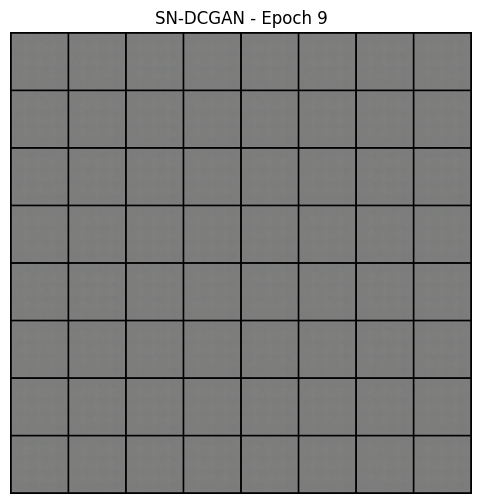

[SN-DCGAN] Epoch [10/10] LossD: 1.060  LossG: 0.699


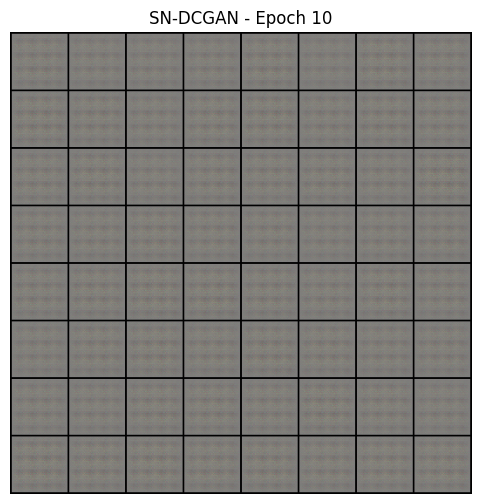

[WGAN-GP] Epoch [1/10] LossD: 9.075  LossG: 3.489


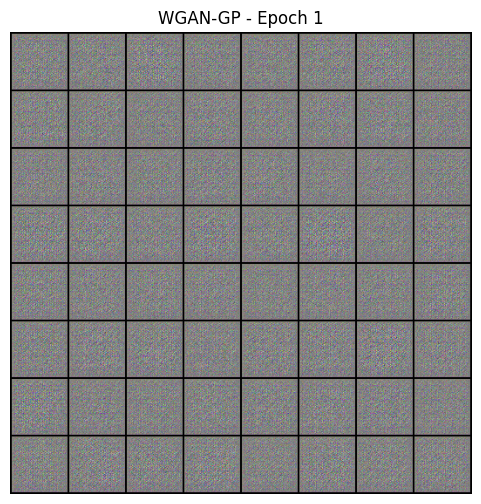

[WGAN-GP] Epoch [2/10] LossD: -4.106  LossG: 8.318


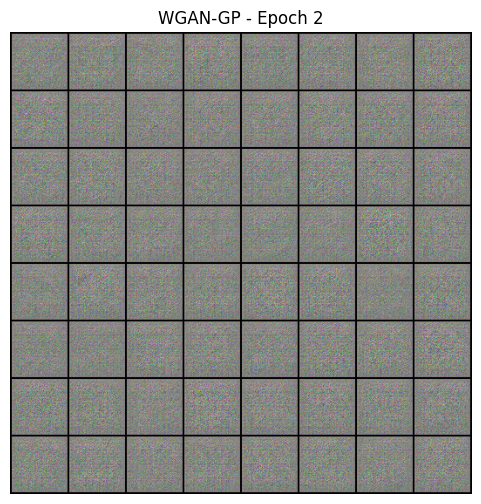

[WGAN-GP] Epoch [3/10] LossD: -4.593  LossG: 8.528


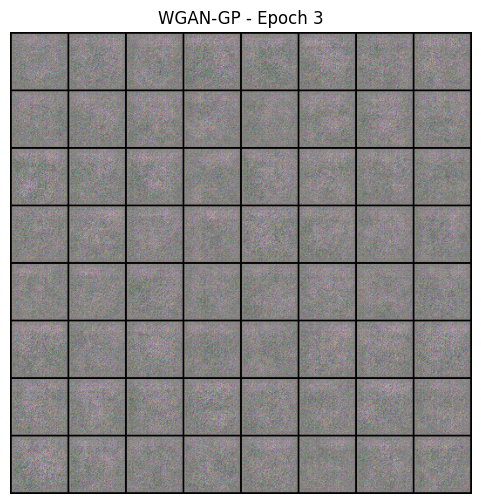

[WGAN-GP] Epoch [4/10] LossD: -8.985  LossG: 5.806


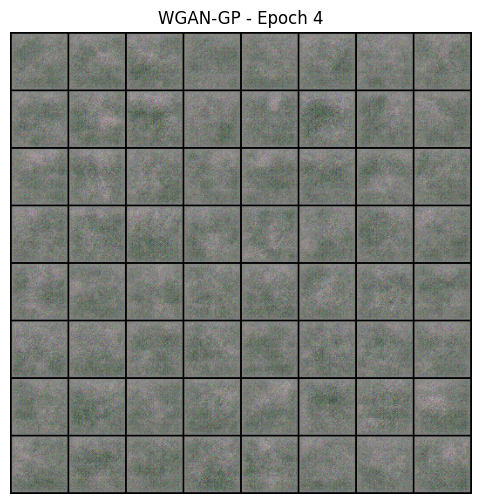

[WGAN-GP] Epoch [5/10] LossD: -9.143  LossG: 8.002


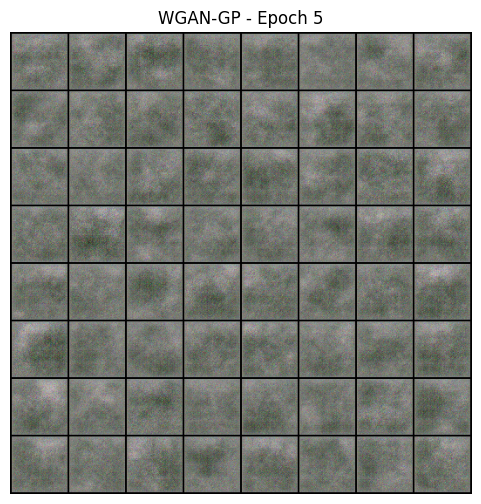

[WGAN-GP] Epoch [6/10] LossD: -10.948  LossG: 9.386


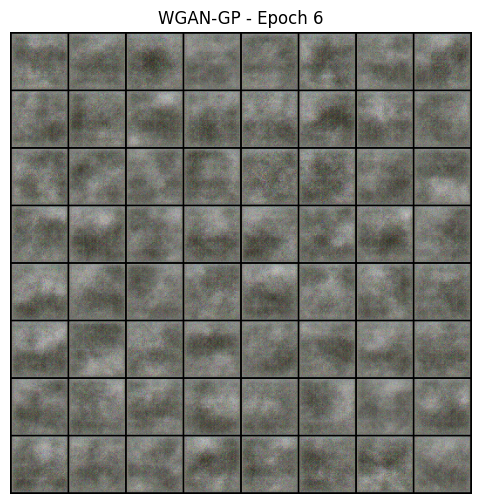

[WGAN-GP] Epoch [7/10] LossD: -13.990  LossG: 9.296


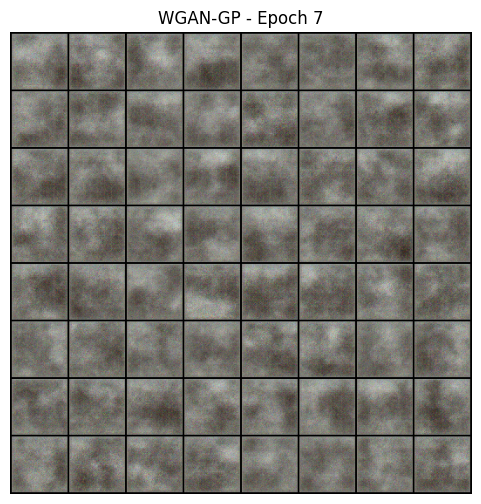

[WGAN-GP] Epoch [8/10] LossD: -9.561  LossG: 5.018


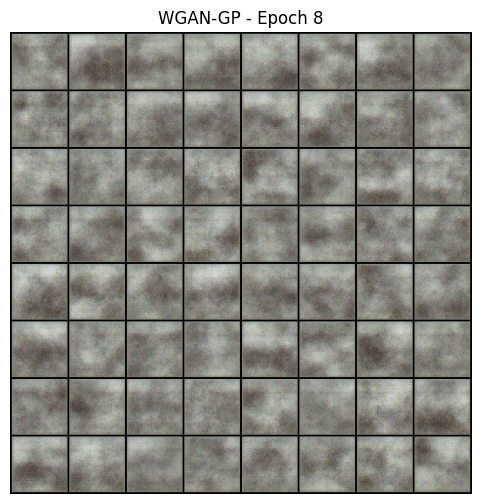

[WGAN-GP] Epoch [9/10] LossD: -12.285  LossG: 8.561


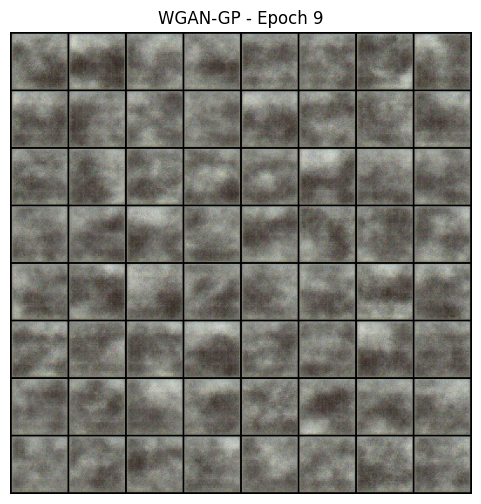

[WGAN-GP] Epoch [10/10] LossD: -14.466  LossG: 7.500


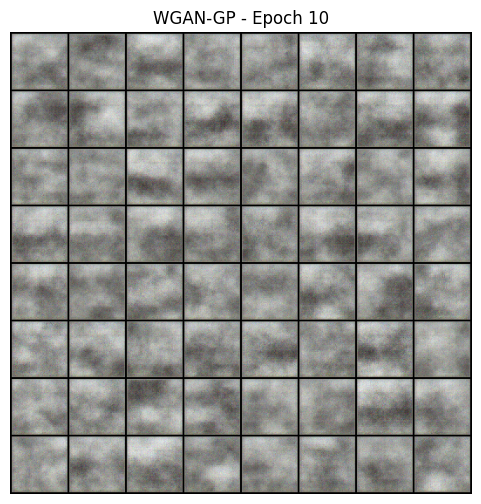

In [47]:
# DCGAN
dcgan_G, dcgan_D, dcgan_Gloss, dcgan_Dloss = train_dcgan(num_epochs=10)

# SN-DCGAN
sn_G, sn_D, sn_Gloss, sn_Dloss = train_sn_dcgan(num_epochs=10)

# WGAN-GP
wgan_G, wgan_D, wgan_Gloss, wgan_Dloss = train_wgangp(num_epochs=10)


In [ ]:
# # Model architecture 2 for validation (DCGAN-Deep)
# class GeneratorDeep(Generator):
#     def __init__(self):
#         super().__init__()
#         # overwrite ngf
#         self.main[0] = nn.ConvTranspose2d(nz, 128*8, 4, 1, 0, bias=False)

# class DiscriminatorDeep(Discriminator):
#     def __init__(self):
#         super().__init__()
#         # overwrite ndf
#         self.main[0] = nn.Conv2d(nc, 128, 4, 2, 1, bias=False)


In [50]:
# #Training process
# num_epochs = 20

# G_losses = []
# D_losses = []
# # 
# for epoch in range(num_epochs):
#     for i, real_images in enumerate(dataloader):

#         real_images = real_images.to(device)
#         batch_size = real_images.size(0)

#         label_real = torch.full((batch_size,), 0.9, device=device)  # label smoothing
#         label_fake = torch.full((batch_size,), 0.0, device=device)

     
#         # Training Discriminator
       
#         netD.zero_grad()

#         output_real = netD(real_images)
#         lossD_real = criterion(output_real, label_real)

#         noise = torch.randn(batch_size, nz, 1, 1, device=device)
#         fake_images = netG(noise)
#         output_fake = netD(fake_images.detach())
#         lossD_fake = criterion(output_fake, label_fake)

#         lossD = lossD_real + lossD_fake
#         lossD.backward()
#         optimizerD.step()

   
#         # Training Generator
   
#         netG.zero_grad()
#         output_fake2 = netD(fake_images)
#         lossG = criterion(output_fake2, label_real)
#         lossG.backward()
#         optimizerG.step()

#         G_losses.append(lossG.item())
#         D_losses.append(lossD.item())

#     # showing generated samples every epoch
#     with torch.no_grad():
#         fake = netG(fixed_noise).cpu()
#     grid = vutils.make_grid(fake, nrow=8, normalize=True, value_range=(-1,1))

#     plt.figure(figsize=(6,6))
#     plt.imshow(np.transpose(grid.numpy(), (1,2,0)))
#     plt.axis("off")
#     plt.title(f"Generated Images - Epoch {epoch+1}")
#     plt.show()

#     print(f"Epoch [{epoch+1}/{num_epochs}] | LossD: {lossD.item():.3f} | LossG: {lossG.item():.3f}")


#### Results

Plotting Loss Curves

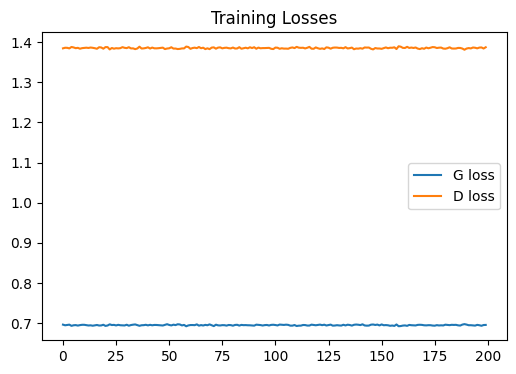

In [51]:
#Plotting Loss Curves
plt.figure(figsize=(6,4))
plt.plot(G_losses, label='G loss')
plt.plot(D_losses, label='D loss')
plt.legend()
plt.title("Training Losses")
plt.show()


DCGAN and SN-DCGAN model results


The result for the DCGAN and SN-DCGAN models shows that the generator output is mostly consistent - a constant grey image for all the inputs. This indicates that there was quick convergence for the generator, although this convergence was to an undesired solution where the parameters created almost zero activations. A reason for this could be that the discriminator attempted to learn too fast, resulting in almost no useful gradient signal to the generator.

WGAN-GP model results

The WGAN-GP model had a different behavior. It does not have a uniform grey instead it produced cloudy grey textures with some colors and the Wasserstein + gradient penalty objective is allowing the model to explore the space more smoothly. This indicates better performance than the other 2 models, with the generator creating some meaningful gradients. However, the training is still very far from the desired state and the model has not yet learned to represent Monet’s colour distribution and the outputs remain far from realistic paintings.

#### Creating Kaggle Submission

In [58]:
torch.save(netG.state_dict(), "generator_monet.pth")


In [59]:
netG = Generator().to(device)    
netG.load_state_dict(torch.load("generator_monet.pth", map_location=device))
netG.eval()


Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [60]:
import os
from torchvision import transforms
from PIL import Image

# Generating 7000 images for kaggle
NUM_IMAGES = 7000      
LATENT_DIM = nz        

OUT_DIR = "images"     
os.makedirs(OUT_DIR, exist_ok=True)

# transform to upsample to 256x256
upsample_to_256 = transforms.Resize((256, 256))

with torch.no_grad():
    idx = 0
    batch_size_gen = 64   

    while idx < NUM_IMAGES:
        cur_batch = min(batch_size_gen, NUM_IMAGES - idx)

        noise = torch.randn(cur_batch, LATENT_DIM, 1, 1, device=device)
        fake_batch = netG(noise).cpu()   
        # from [-1,1] -> [0,1]
        fake_batch = (fake_batch * 0.5) + 0.5

        for i in range(cur_batch):
            img_tensor = fake_batch[i]
            img = transforms.ToPILImage()(img_tensor)
            img = upsample_to_256(img)   # now 256x256

            # filename like image_00001.png
            filename = f"image_{idx + i:05d}.png"
            img.save(os.path.join(OUT_DIR, filename))

        idx += cur_batch

print("Done generating images:", len(os.listdir(OUT_DIR)))


Done generating images: 7000


In [61]:
#Check number of generated images
print(len(os.listdir(OUT_DIR))) 


7000


In [17]:
#Creating images.zip for submission
import zipfile

zip_filename = "images.zip"

with zipfile.ZipFile(zip_filename, "w", zipfile.ZIP_DEFLATED) as zipf:
    for fname in os.listdir(OUT_DIR):
        fpath = os.path.join(OUT_DIR, fname)
      
        zipf.write(fpath, arcname=fname)

print("Created:", zip_filename)


Created: images.zip


#### Conclusion

For this project, 3 models were implemented:
(1) a baseline DCGAN using standard generator and discriminator architectures with 64 feature channels
(2) SN-DCGAN (Spectral Normalization GAN)
(3) WGAN-GP (Wasserstein GAN with Gradient Penalty)

None of these model architectures fully converged to high-quality Monet-style generations. Both DCGAN and SN-DCGAN generated constant grey outputs which is expected when the discrimintor has a significant influence over the generator, without a corresponding escape mechanism - an optimization signal. 

On the other hand, the WGAN-DP model produced non-constant, more textured outputs. Although the images were stil close to grayscale and not recognizable, they showed more variation and had smoother training behaviour. 

For future improvements, I could further explore and optimize the WGAN-DP model, using more epochs and better optimization parameters.

